In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
df = pd.read_csv('../input/bankmarketingdatasetbank/bank.csv')

In [3]:
import pandas_profiling as pp
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/30 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Dataframe Check

In [4]:
df.shape

(11162, 17)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11162 non-null  int64 
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(7), object(10)
memory usage: 1.4+ MB


In [6]:
df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000
mean,41.231948,1528.538524,15.658036,371.993818,2.508421,51.330407,0.832557
std,11.913369,3225.413326,8.420740,347.128386,2.722077,108.758282,2.292007
min,18.000000,-6847.000000,1.000000,2.000000,1.000000,-1.000000,0.000000
25%,32.000000,122.000000,8.000000,138.000000,1.000000,-1.000000,0.000000
50%,39.000000,550.000000,15.000000,255.000000,2.000000,-1.000000,0.000000
75%,49.000000,1708.000000,22.000000,496.000000,3.000000,20.750000,1.000000
max,95.000000,81204.000000,31.000000,3881.000000,63.000000,854.000000,58.000000


In [7]:
df.describe(include='object')

,job,marital,education,default,housing,loan,contact,month,poutcome,deposit
count,11162,11162,11162,11162,11162,11162,11162,11162,11162,11162
unique,12,3,4,2,2,2,3,12,4,2
top,management,married,secondary,no,no,no,cellular,may,unknown,no
freq,2566,6351,5476,10994,5881,9702,8042,2824,8326,5873


# **Data Distribution**

## Categorical Data

In [8]:
categorical_features=[feature for feature in df.columns if ((df[feature].dtypes=='O') & (feature not in ['deposit']))]
categorical_features

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'poutcome']

In [9]:
for feature in categorical_features:
    print('The feature is {} and number of categories are {}'.format(feature,len(df[feature].unique())))

The feature is job and number of categories are 12
The feature is marital and number of categories are 3
The feature is education and number of categories are 4
The feature is default and number of categories are 2
The feature is housing and number of categories are 2
The feature is loan and number of categories are 2
The feature is contact and number of categories are 3
The feature is month and number of categories are 12
The feature is poutcome and number of categories are 4


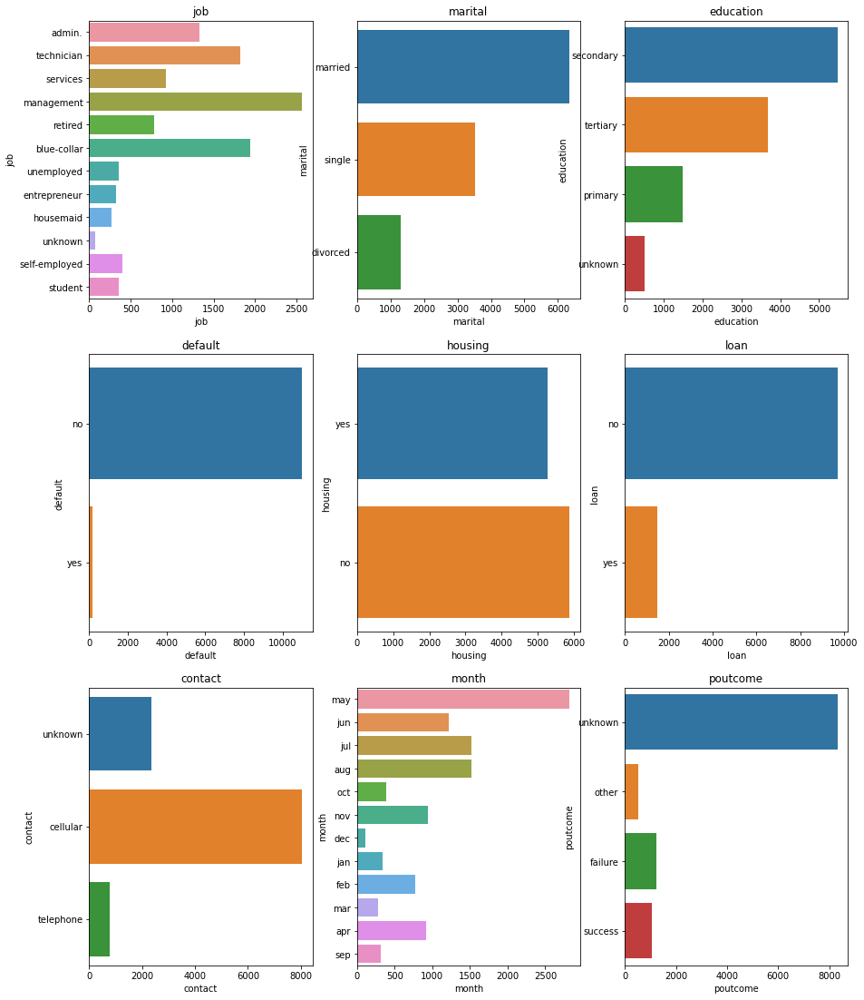

In [10]:
#check count based on categorical features
plt.figure(figsize=(15,80), facecolor='white')
plotnumber =1
for categorical_feature in categorical_features:
    ax = plt.subplot(12,3,plotnumber)
    sns.countplot(y=categorical_feature,data=df)
    plt.xlabel(categorical_feature)
    plt.title(categorical_feature)
    plotnumber+=1
plt.show()

## Relationship between Categorical Features and Label

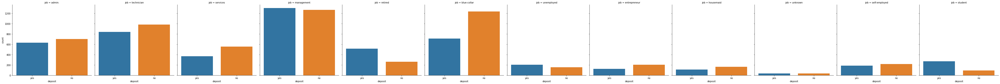

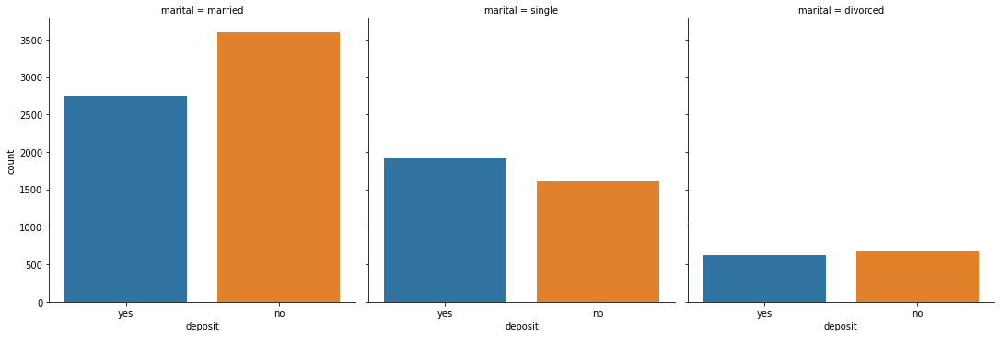

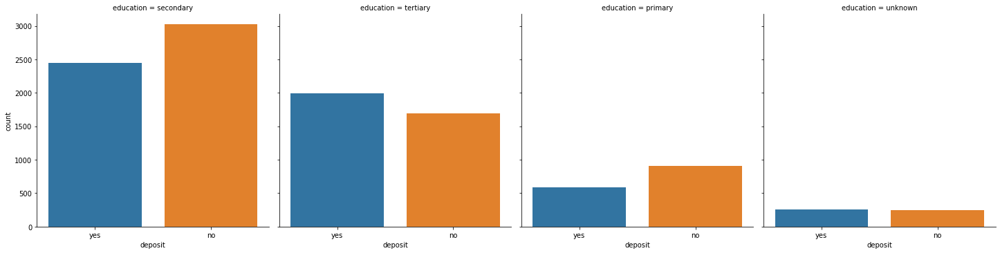

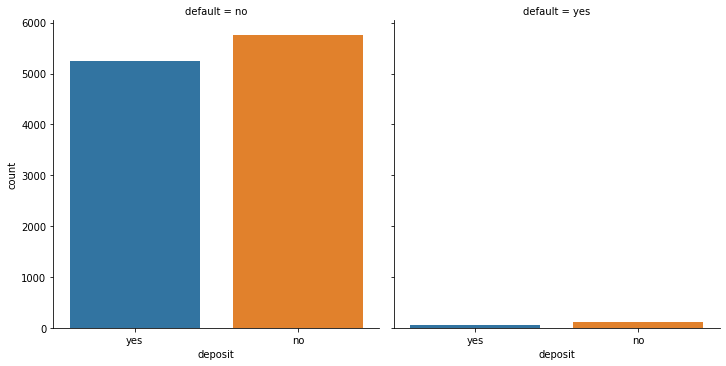

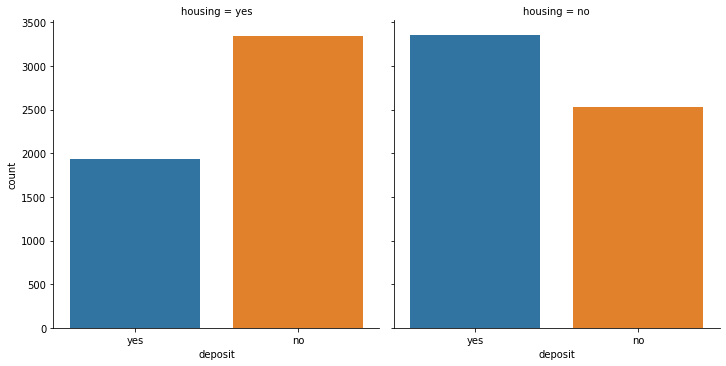

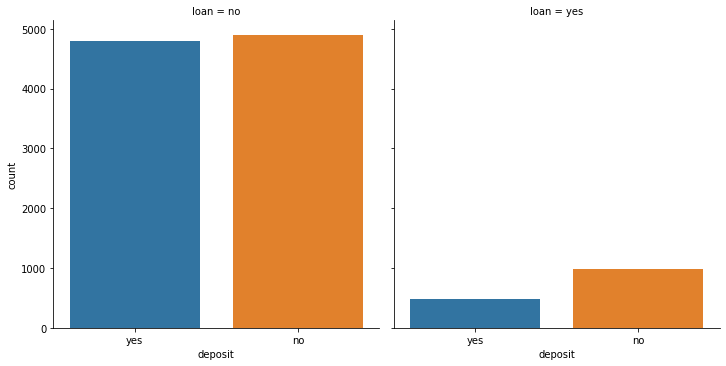

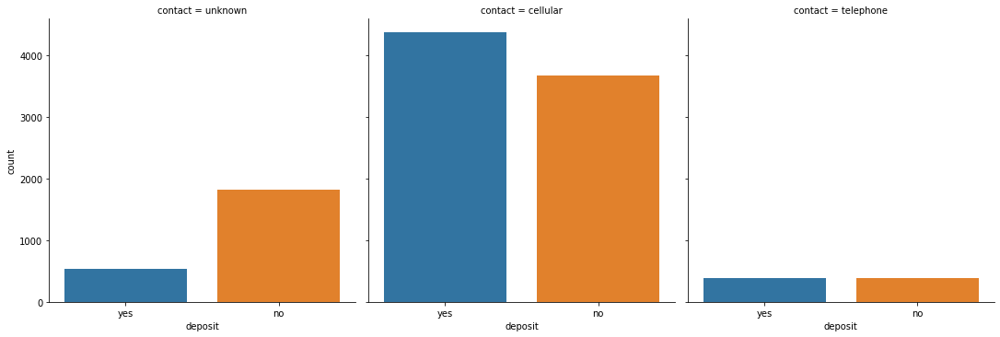

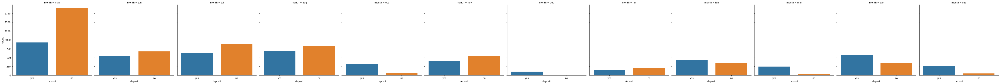

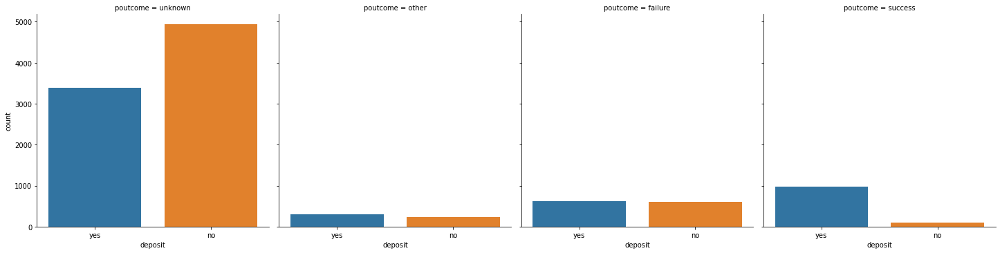

In [11]:
#check target label split over categorical features
#Find out the relationship between categorical variable and dependent variable
for categorical_feature in categorical_features:
    sns.catplot(x='deposit', col=categorical_feature, kind='count', data= df)
plt.show()

In [12]:
for categorical_feature in categorical_features:
    print(df.groupby(['deposit',categorical_feature]).size())

deposit  job          
no       admin.            703
         blue-collar      1236
         entrepreneur      205
         housemaid         165
         management       1265
         retired           262
         self-employed     218
         services          554
         student            91
         technician        983
         unemployed        155
         unknown            36
yes      admin.            631
         blue-collar       708
         entrepreneur      123
         housemaid         109
         management       1301
         retired           516
         self-employed     187
         services          369
         student           269
         technician        840
         unemployed        202
         unknown            34
dtype: int64
deposit  marital 
no       divorced     671
         married     3596
         single      1606
yes      divorced     622
         married     2755
         single      1912
dtype: int64
deposit  education
no       prima

##  Numerical Features

In [13]:
numerical_features = [feature for feature in df.columns if ((df[feature].dtypes != 'O') & (feature not in ['deposit']))]
print('Number of numerical variables: ', len(numerical_features))


df[numerical_features].head()

Number of numerical variables:  7


,age,balance,day,duration,campaign,pdays,previous
0,59,2343,5,1042,1,-1,0
1,56,45,5,1467,1,-1,0
2,41,1270,5,1389,1,-1,0
3,55,2476,5,579,1,-1,0
4,54,184,5,673,2,-1,0


##  Discrete Numerical Features

In [14]:
discrete_feature=[feature for feature in numerical_features if len(df[feature].unique())<25]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 0


## Continous Numerical Features

In [15]:
continuous_features=[feature for feature in numerical_features if feature not in discrete_feature+['deposit']]
print("Continuous feature Count {}".format(len(continuous_features)))

Continuous feature Count 7


## Distribution of Continous Numerical Features

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

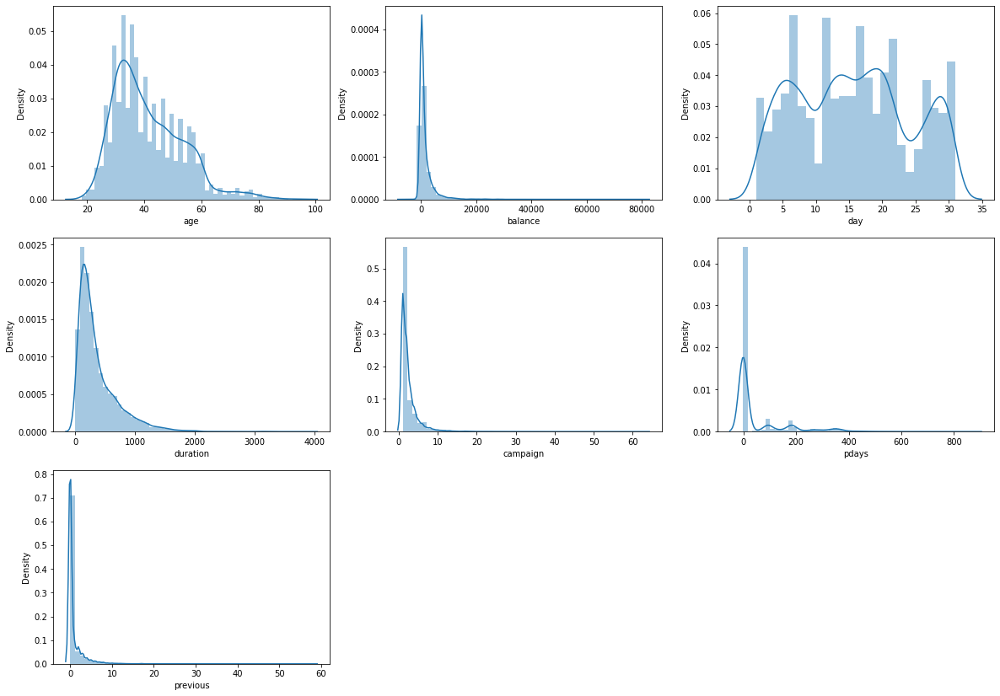

In [16]:
plt.figure(figsize=(20,60), facecolor='white')
plotnumber =1
for continuous_feature in continuous_features:
    ax = plt.subplot(12,3,plotnumber)
    sns.distplot(df[continuous_feature])
    plt.xlabel(continuous_feature)
    plotnumber+=1
plt.show()

## Relation between Continous numerical Features and Labels

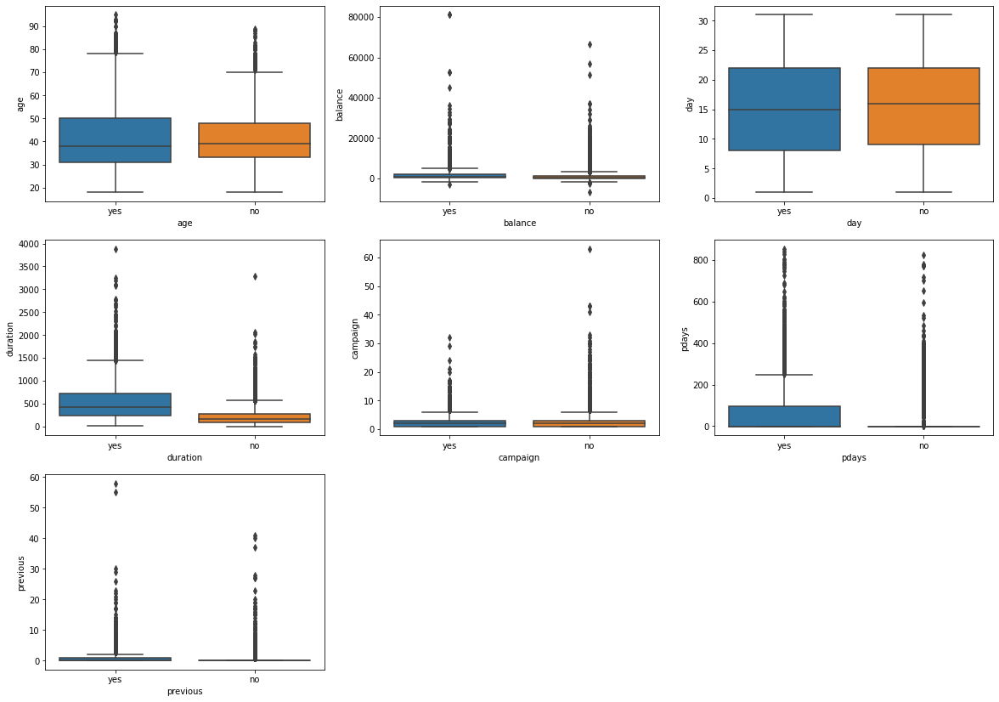

In [17]:
plt.figure(figsize=(20,60), facecolor='white')
plotnumber =1
for feature in continuous_features:
    ax = plt.subplot(12,3,plotnumber)
    sns.boxplot(x="deposit", y= df[feature], data=df)
    plt.xlabel(feature)
    plotnumber+=1
plt.show()

## Feature Analysis

In [18]:
print(df.isnull().sum())

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
deposit      0
dtype: int64


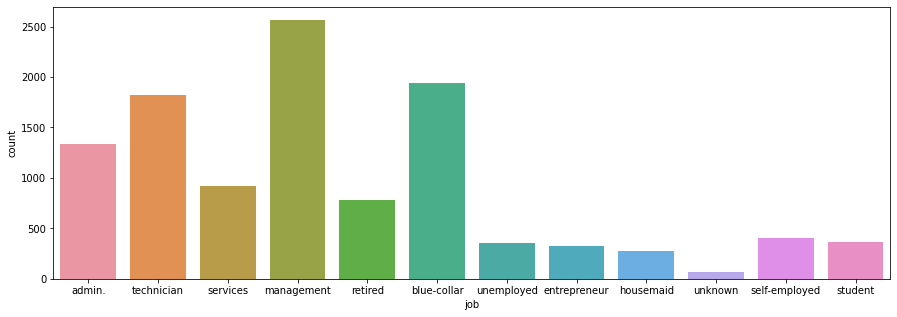

In [19]:
plt.figure(figsize=(15, 5))
sns.countplot(x = "job", data = df, label = "Count")
plt.show()

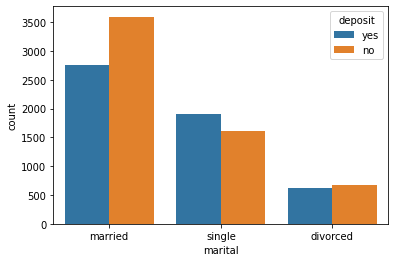

In [20]:
sns.countplot(x = "marital", data=df, hue = "deposit")
plt.show()

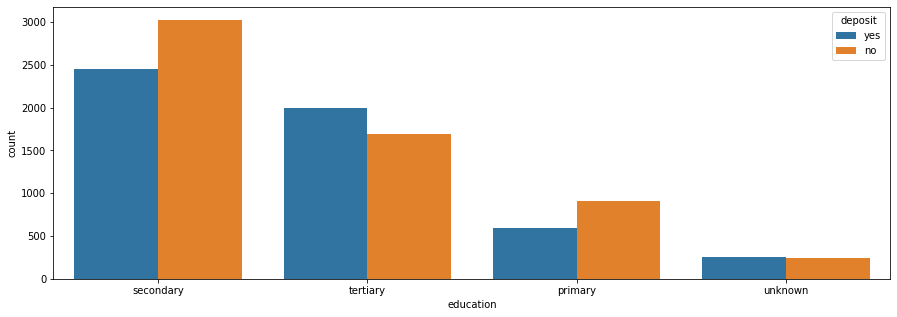

In [21]:
plt.figure(figsize=(15, 5))
sns.countplot(x = "education", data = df, hue = "deposit")
plt.show()


If you want, we could integrate "primary" and "secondary" as they have similar factorial level. But I think the categories are reasonable. We could make the class by number such as 1: primary, 2: secondary, 3: tertiary, however, it is difficult how to classify the "unknown". Then it might be treated as the categories separately.

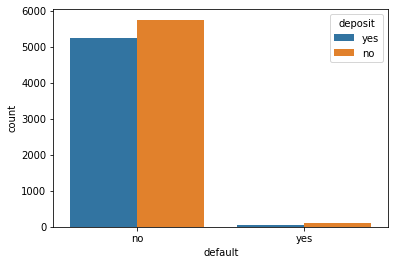

In [22]:
sns.countplot(x ="default", data = df, hue = "deposit")
plt.show()

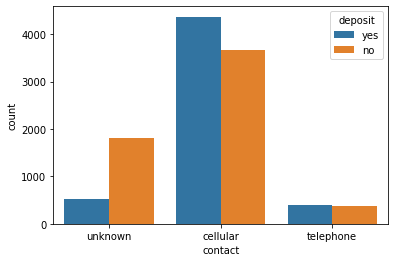

In [23]:
sns.countplot(x = "contact", data = df, hue = "deposit")
plt.show()

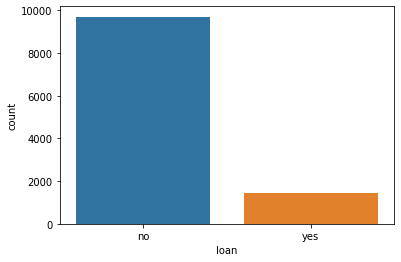

In [24]:
sns.countplot(x = "loan", data = df,label = "Count")
plt.show()

<AxesSubplot:>

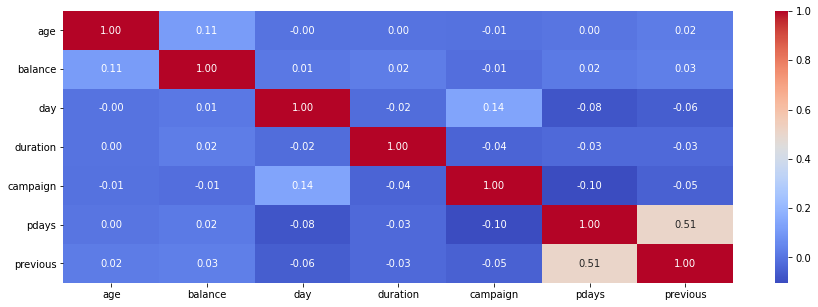

In [25]:
plt.figure(figsize=(15,5))
sns.heatmap(df.corr(), annot=True, fmt = ".2f", cmap = "coolwarm")

<AxesSubplot:xlabel='month', ylabel='count'>

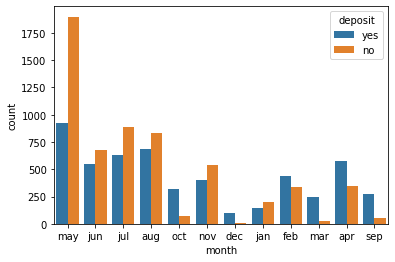

In [26]:
sns.countplot(x = "month", data = df, hue= "deposit")

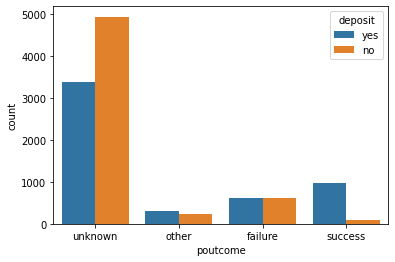

In [27]:
sns.countplot(x = "poutcome", data = df, hue= "deposit")
plt.show()

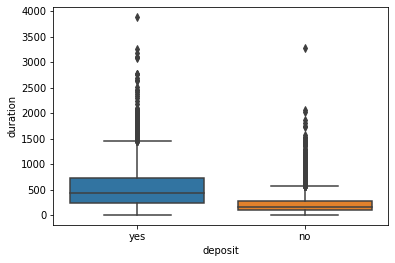

In [28]:
sns.boxplot(x = "deposit", y = "duration", data = df)
plt.show()

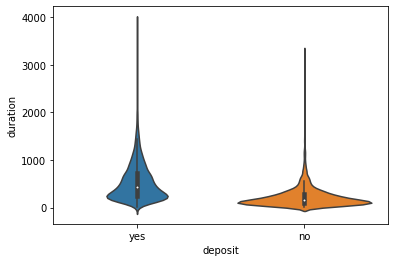

In [29]:
sns.violinplot(x = "deposit", y = "duration", data = df)
plt.show()

## Find Outliers

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/lib/python3.7/site-packages/seaborn

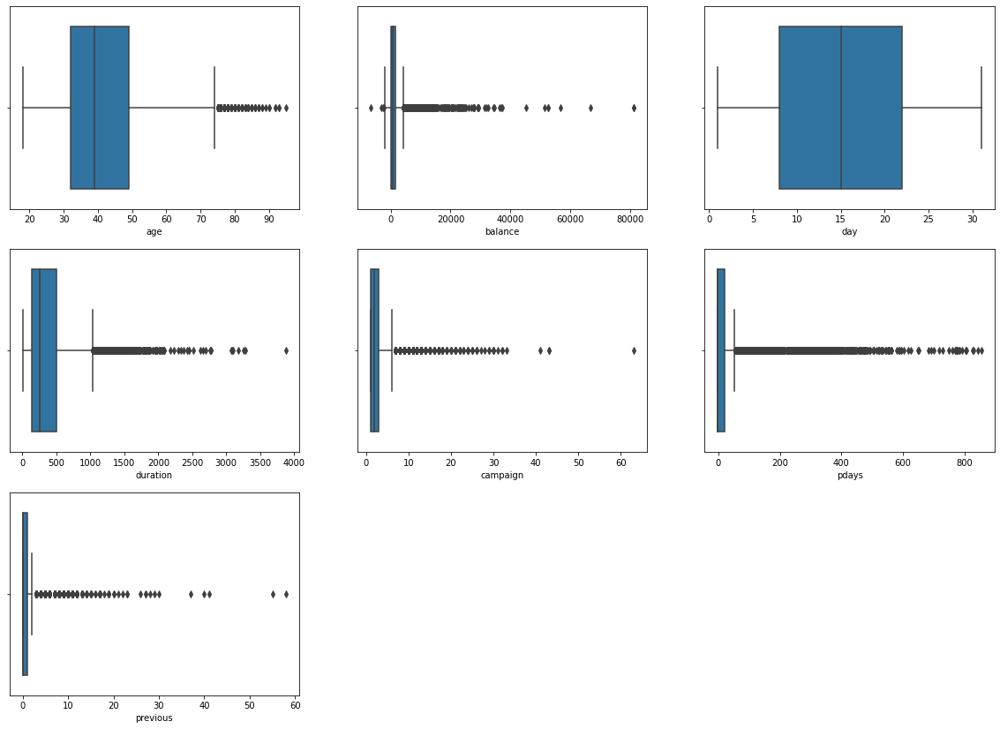

In [30]:
plt.figure(figsize=(20,60), facecolor='white')
plotnumber =1
for numerical_feature in numerical_features:
    ax = plt.subplot(12,3,plotnumber)
    sns.boxplot(df[numerical_feature])
    plt.xlabel(numerical_feature)
    plotnumber+=1
plt.show()

## Correlation between numerical features

<AxesSubplot:>

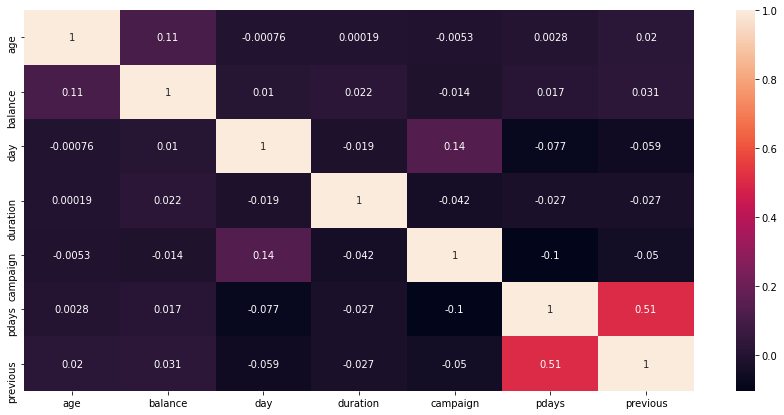

In [31]:
cor_mat=df.corr()
fig = plt.figure(figsize=(15,7))
sns.heatmap(cor_mat,annot=True)

# **Feature Engineering**

##  Convert Categorical into Numeric Form

In [32]:
df.dropna(inplace=True)

## Checking Outliers

([<matplotlib.axis.XTick at 0x7f3184a6a8d0>,
 [Text(0, 0, 'age'),
  Text(1, 0, 'job'),
  Text(2, 0, 'marital'),
  Text(3, 0, 'education'),
  Text(4, 0, 'default'),
  Text(5, 0, 'balance'),
  Text(6, 0, 'housing'),
  Text(7, 0, 'loan'),
  Text(8, 0, 'contact'),
  Text(9, 0, 'day'),
  Text(10, 0, 'month'),
  Text(11, 0, 'duration'),
  Text(12, 0, 'campaign'),
  Text(13, 0, 'pdays'),
  Text(14, 0, 'previous'),
  Text(15, 0, 'poutcome'),
  Text(16, 0, 'deposit')])

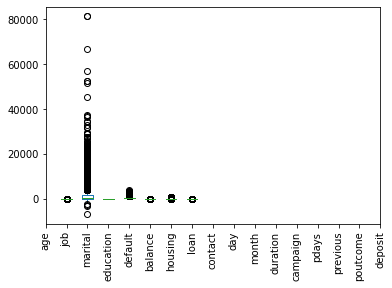

In [33]:
df.plot.box()
plt.xticks(list(range(len(df.columns))),df.columns, rotation="vertical")

## Checking outlier of age attribute


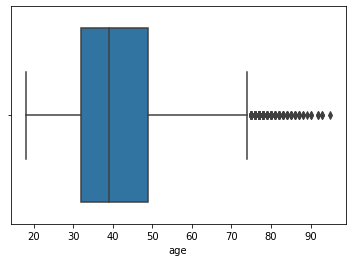

In [34]:
ax = sns.boxplot(x="age" , data=df)

## Handleing Outliers

In [35]:
df2=df.copy()

In [36]:
low = 0.01
high = 0.99
qdf=df2.quantile([low,high])


In [37]:
df2.age= df2.age.apply(lambda v:v if qdf.age[low]< v < qdf.age[high] else np.nan)

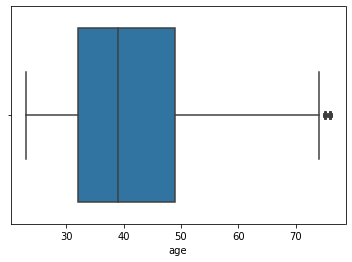

In [38]:
ax = sns.boxplot(x="age" , data=df2)

In [39]:
#Checki Oultier
df2.groupby(['deposit','default']).size()

deposit  default
no       no         5757
         yes         116
yes      no         5237
         yes          52
dtype: int64

In [40]:
#Removing Outlier
df2.drop(['default'],axis=1, inplace=True)

In [41]:
#Checki Oultier
df2.groupby(['deposit','pdays']).size()

deposit  pdays
no       -1       4940
          1          2
          2          6
          5          2
          6          2
                  ... 
yes       804        1
          805        1
          828        1
          842        1
          854        1
Length: 732, dtype: int64

In [42]:
# drop pdays as it has -1 value for around 40%+ 
df2.drop(['pdays'],axis=1, inplace=True)

In [43]:
# remove outliers in feature balance...
df2.groupby(['deposit','balance'],sort=True)['balance'].count()
# these outlier should not be remove as balance goes high, client show interest on deposit

deposit  balance
no       -6847      1
         -2712      1
         -2282      1
         -2049      1
         -1965      1
                   ..
yes       34646     1
          36252     1
          45248     1
          52587     2
          81204     2
Name: balance, Length: 5082, dtype: int64

In [44]:
# remove outliers in feature duration...
df2.groupby(['deposit','duration'],sort=True)['duration'].count()
# these outlier should not be remove as duration goes high, client show interest on deposit

deposit  duration
no       2           1
         3           1
         4           2
         5           4
         6           6
                    ..
yes      3094        1
         3102        1
         3183        1
         3253        1
         3881        1
Name: duration, Length: 2157, dtype: int64

In [45]:
# remove outliers in feature campaign...
df2.groupby(['deposit','campaign'],sort=True)['campaign'].count()

deposit  campaign
no       1           2237
         2           1627
         3            703
         4            454
         5            239
         6            173
         7             92
         8             96
         9             51
         10            38
         11            24
         12            25
         13            24
         14            11
         15             9
         16             7
         17             8
         18             8
         19             5
         20             4
         21             7
         22             4
         23             3
         24             4
         25             3
         26             3
         27             1
         28             1
         29             1
         30             4
         31             1
         32             1
         33             1
         41             1
         43             2
         63             1
yes      1           2561
         2          

In [46]:
df3 = df2[df2['campaign'] < 33]

In [47]:
# remove outliers in feature previous...
df3.groupby(['deposit','previous'],sort=True)['previous'].count()

deposit  previous
no       0           4935
         1            304
         2            237
         3            141
         4             73
         5             44
         6             34
         7             23
         8             21
         9             10
         10             4
         11             8
         12             6
         13             2
         14             1
         15             4
         16             2
         17             8
         18             1
         19             2
         20             1
         23             1
         27             2
         28             1
         37             1
         40             1
         41             1
yes      0           3384
         1            583
         2            456
         3            294
         4            171
         5            121
         6             83
         7             54
         8             39
         9             24
         10         

In [48]:
df4 = df3[df3['previous'] < 31]

In [49]:
cat_columns = ['job', 'marital', 'education', 'contact', 'month', 'poutcome']
for col in  cat_columns:
    df4 = pd.concat([df4.drop(col, axis=1),pd.get_dummies(df4[col], prefix=col, prefix_sep='_',drop_first=True, dummy_na=False)], axis=1)

In [50]:
bool_columns = ['housing', 'loan','deposit']
for col in  bool_columns:
    df4[col+'_new']=df4[col].apply(lambda x : 1 if x == 'yes' else 0)
    df4.drop(col, axis=1, inplace=True)

In [51]:
df4.head()

,age,balance,day,duration,campaign,previous,job_blue-collar,job_entrepreneur,job_housemaid,job_management,...,month_may,month_nov,month_oct,month_sep,poutcome_other,poutcome_success,poutcome_unknown,housing_new,loan_new,deposit_new
0,59.0,2343,5,1042,1,0,0,0,0,0,...,1,0,0,0,0,0,1,1,0,1
1,56.0,45,5,1467,1,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,1
2,41.0,1270,5,1389,1,0,0,0,0,0,...,1,0,0,0,0,0,1,1,0,1
3,55.0,2476,5,579,1,0,0,0,0,0,...,1,0,0,0,0,0,1,1,0,1
4,54.0,184,5,673,2,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,1


In [52]:
print(df4.isnull().sum())

age                    251
balance                  0
day                      0
duration                 0
campaign                 0
previous                 0
job_blue-collar          0
job_entrepreneur         0
job_housemaid            0
job_management           0
job_retired              0
job_self-employed        0
job_services             0
job_student              0
job_technician           0
job_unemployed           0
job_unknown              0
marital_married          0
marital_single           0
education_secondary      0
education_tertiary       0
education_unknown        0
contact_telephone        0
contact_unknown          0
month_aug                0
month_dec                0
month_feb                0
month_jan                0
month_jul                0
month_jun                0
month_mar                0
month_may                0
month_nov                0
month_oct                0
month_sep                0
poutcome_other           0
poutcome_success         0
p

In [53]:
df4.dropna(inplace=True)

In [54]:
import pandas_profiling as pp
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/30 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **Split Dataset into Training set and Test set**

In [55]:
X = df4.drop(['deposit_new'],axis=1)
y = df4['deposit_new']
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=42)

In [56]:
len(X_train)

8720

In [57]:
len(X_test)

2181

In [58]:
from sklearn.preprocessing import StandardScaler

features = ['campaign', 'previous']

x_pca = df4.loc[:, features].values
x_pca = StandardScaler().fit_transform(x_pca)

In [59]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)

principalComponents = pca.fit_transform(x_pca)
principalDF = pd.DataFrame(data = principalComponents, columns=['PC1', 'PC2'])

In [60]:
pca.components_

array([[-0.70710678,  0.70710678],
       [ 0.70710678,  0.70710678]])

In [61]:
pca.explained_variance_ratio_


array([0.52874416, 0.47125584])

<AxesSubplot:>

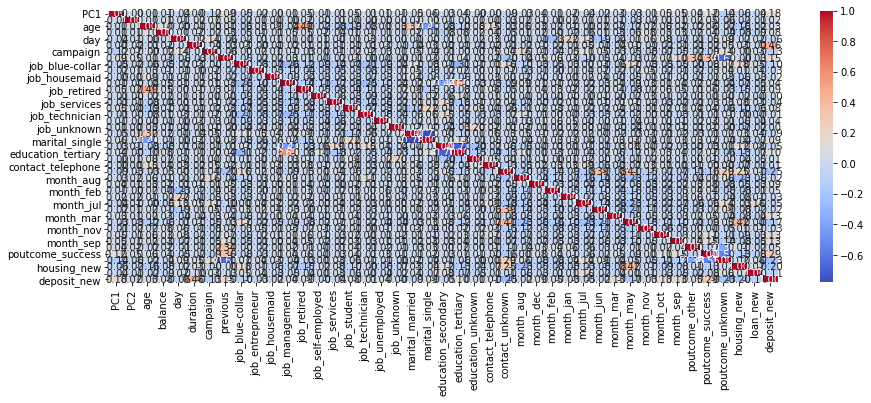

In [62]:
# Concatenation of dataframes
df_all = pd.concat([principalDF, df4], axis=1)
plt.figure(figsize=(15,5))
sns.heatmap(df_all.corr(), annot=True, fmt = ".2f", cmap = "coolwarm")

##  Different Classifiers libraries

In [63]:
import xgboost as xgb

from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
from sklearn.metrics import r2_score,confusion_matrix, mean_squared_error,accuracy_score, f1_score,classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import GaussianNB
import warnings
from sklearn import metrics
warnings.filterwarnings("ignore", category=FutureWarning)

## **Random Forest, Cross Validation and Confusion Matrix**

In [64]:
rf = RandomForestClassifier() 
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)

print(round(accuracy_score(y_test, rf_pred),2)*100)

87.0


In [65]:
RForest=RandomForestClassifier(n_estimators=20)
RForest.fit(X_train,np.ravel(y_train,order='C'))
RFPred=RForest.predict(X_test)
#rint("Random Forest Accuracy : " ,accuracy_score(y_test,RFPred))

print("Cross Valudate Score : ", cross_val_score(RForest,X_test,y_test.values.ravel()))
print("Confisuon matrix :", confusion_matrix(y_test,RFPred.ravel()))
print(classification_report(y_test,RFPred))

Cross Valudate Score :  [0.81693364 0.81880734 0.85550459 0.82110092 0.85091743]
Confisuon matrix : [[1018  157]
 [ 144  862]]
              precision    recall  f1-score   support

           0       0.88      0.87      0.87      1175
           1       0.85      0.86      0.85      1006

    accuracy                           0.86      2181
   macro avg       0.86      0.86      0.86      2181
weighted avg       0.86      0.86      0.86      2181



## Bayes Model

In [66]:
BayesModel=GaussianNB()
BayesModel.fit(X_train,y_train.values.ravel())
bayesPred=BayesModel.predict(X_test)
print("Bayes Model Accuracy :", accuracy_score(y_test,bayesPred.ravel()))
print("Cross val score :", cross_val_score(BayesModel,X_train,y_train.values.ravel(),cv=10,n_jobs=2,scoring='accuracy').mean())

Bayes Model Accuracy : 0.7281063732232921
Cross val score : 0.7243119266055046


## K-Neighbors Classifier

In [67]:
#grid={'n_neighbors': np.arange(1,20,1)}
KnnClass=KNeighborsClassifier(n_neighbors=9)
#KnnCV=GridSearchCV(KnnClas, grid, cv=10)
KnnClass.fit(X_train,np.ravel(y_train,order='C'))
#print("Best Parameters : {}\nBest Score {} ".format(KnnCV.best_params_, KnnCV.best_score_) )

KNeighborsClassifier(n_neighbors=9)

## Xg Boost Classifier

In [68]:

Xgboost=XGBClassifier(learning_rate=0.1,max_depth=4, n_estimators=100,verbosity=1)
Xgboost.fit(X_train,np.ravel(y_train,order='C'))
y_pred=Xgboost.predict(X_test)
print("Test accuracy with XGBoos: ",accuracy_score(y_test,y_pred))

/opt/conda/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:14:12] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Test accuracy with XGBoos:  0.8661164603392939


Logistic Regression

## SVM

In [69]:
grid={'C':[0.0001,0.001,0.01,1] ,'gamma':['auto','scale'],'kernel':['rbf','linear','sigmoid'] , 'max_iter':[10,100]}
SVCModel=SVC(probability=True)
SVCGCV=GridSearchCV(SVCModel,grid,cv=10)
SVCGCV.fit(X_train,np.ravel(y_train, order='C'))
print("Best Params {} and best score {}".format(SVCGCV.best_params_, SVCGCV.best_score_))
#print(SVCModel.score(x_test,np.ravel(y_test, order='C')))

/opt/conda/lib/python3.7/site-packages/sklearn/svm/_base.py:249: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/svm/_base.py:249: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/svm/_base.py:249: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/svm/_base.py:249: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/svm/_base.py:

Best Params {'C': 1, 'gamma': 'auto', 'kernel': 'rbf', 'max_iter': 100} and best score 0.5307339449541285


/opt/conda/lib/python3.7/site-packages/sklearn/svm/_base.py:249: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:33: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:34: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.


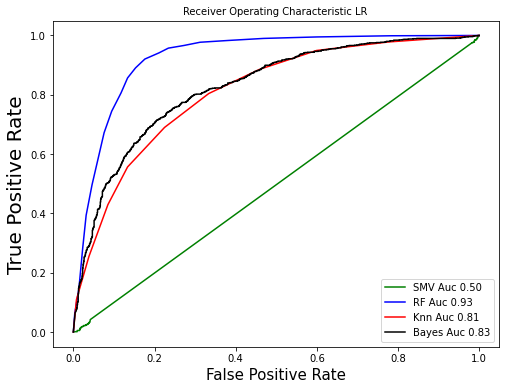

In [70]:
fig, ax_Array = plt.subplots(nrows = 1,  figsize = (8,6))

# bayes roc
probs = BayesModel.predict_proba(X_test)
preds = probs[:,1]
fprbayes, tprxbayes, thresholdbayes = metrics.roc_curve(y_test, preds)
roc_aucbayes = metrics.auc(fprbayes, tprxbayes)


# KNN roc
probs=KnnClass.predict_proba(X_test)
predKnn=probs[:,1]
fprKnn, tprKnn, thresholdKnn=metrics.roc_curve(y_test,predKnn)
roc_aucknn=metrics.auc(fprKnn,tprKnn)


# Random Forest 
probs=RForest.predict_proba(X_test)
pred_RForest=probs[:,1]
fprRF,tprRF,thresholfRF= metrics.roc_curve(y_test,pred_RForest)
roc_aucRF=metrics.auc(fprRF,tprRF)

 # SVM model roc
 
prob=SVCGCV.predict_proba(X_test)
pred_Svm=prob[:,1]
fprSvm,tprsvm,tresholdSvm=metrics.roc_curve(y_test,pred_Svm)
roc_aucSvm=metrics.auc(fprSvm,tprsvm) 




ax_Array.plot(fprSvm,tprsvm, 'b', label='SMV Auc %0.2f' %roc_aucSvm, color="green")
ax_Array.plot(fprRF,tprRF,'b', label="RF Auc %0.2f"%roc_aucRF, color="blue")
ax_Array.plot(fprKnn,tprKnn,'b', label="Knn Auc %0.2f" %roc_aucknn, color="red")
ax_Array.plot(fprbayes,tprxbayes,'b', label='Bayes Auc %0.2f' % roc_aucbayes, color="black")
ax_Array.set_title('Receiver Operating Characteristic LR ',fontsize=10)
ax_Array.set_ylabel('True Positive Rate',fontsize=20)
ax_Array.set_xlabel('False Positive Rate',fontsize=15)
ax_Array.legend(loc = 'lower right', prop={'size': 10})



plt.subplots_adjust(wspace=1)

## Mean Squared Error

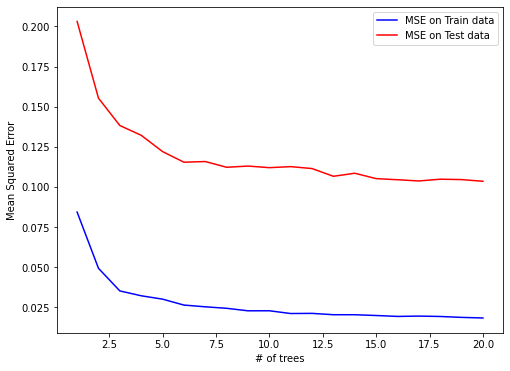

In [71]:

from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=1)
trees, train_loss, test_loss = [], [], []
for iter in range(20):
    rf.fit(X_train, y_train)
    y_train_predicted = rf.predict(X_train)
    y_test_predicted = rf.predict(X_test)
    mse_train = mean_squared_error(y_train, y_train_predicted)
    mse_test = mean_squared_error(y_test, y_test_predicted)
    #print("Iteration: {} Train mse: {} Test mse: {}".format(iter, mse_train, mse_test))
    trees += [rf.n_estimators]
    train_loss += [mse_train]
    test_loss += [mse_test]
    rf.n_estimators += 1
plt.figure(figsize=(8,6))  
plt.plot(trees, train_loss, color="blue", label="MSE on Train data")
plt.plot(trees, test_loss, color="red", label="MSE on Test data")
plt.xlabel("# of trees")
plt.ylabel("Mean Squared Error");
plt.legend()

## **Predictions**

In [72]:
#rf.fit(X_train, y_train)
#rf_pred = rf.predict(X_test)
predict = rf.predict(X_test)
predict

array([0.9 , 0.15, 1.  , ..., 0.  , 0.5 , 0.  ])

In [73]:
real_full=df4['deposit_new']
real=real_full[:1000]

pred = rf.predict(X_test)

df4_1=pd.DataFrame({'real': real, 'prediction':pred[:1000]})

In [74]:
df4.head()

,age,balance,day,duration,campaign,previous,job_blue-collar,job_entrepreneur,job_housemaid,job_management,...,month_may,month_nov,month_oct,month_sep,poutcome_other,poutcome_success,poutcome_unknown,housing_new,loan_new,deposit_new
0,59.0,2343,5,1042,1,0,0,0,0,0,...,1,0,0,0,0,0,1,1,0,1
1,56.0,45,5,1467,1,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,1
2,41.0,1270,5,1389,1,0,0,0,0,0,...,1,0,0,0,0,0,1,1,0,1
3,55.0,2476,5,579,1,0,0,0,0,0,...,1,0,0,0,0,0,1,1,0,1
4,54.0,184,5,673,2,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,1
